# Initial measures
- Test rates per 10k population
- Proportion of a group of tests which were a specific test


In [1]:
import pandas as pd
import numpy as np
from ebmdatalab import charts
from matplotlib import pyplot as plt

## Load the data

In [2]:
df = pd.read_csv("compiled_data_anonymised.csv")

# Convert month to datetime
df.loc[:, "month"] = pd.to_datetime(df["month"])

df.drop(["female_population", "male_population", "total_list_size"], axis=1).head()

,Unnamed: 0,Unnamed: 0.1,ccg_id,count,error,lab,month,practice_id,result_category,rural,test_code,urban,datalab_testcode
0,0,109727,11N,3,2.0,ND,2014-01-01,1,2,1.0,A1AT,0.0,A1AT
1,1,109783,11N,3,2.0,ND,2014-01-01,1,2,1.0,ACCP,0.0,ACCP
2,2,109830,11N,3,2.0,ND,2014-01-01,1,2,1.0,ADNA,0.0,ADNA
3,3,109948,11N,28,0.0,ND,2014-01-01,1,-1,1.0,ALB,0.0,ALB
4,4,109949,11N,572,0.0,ND,2014-01-01,1,0,1.0,ALB,0.0,ALB


# Test rates per 10,000 population - deciles

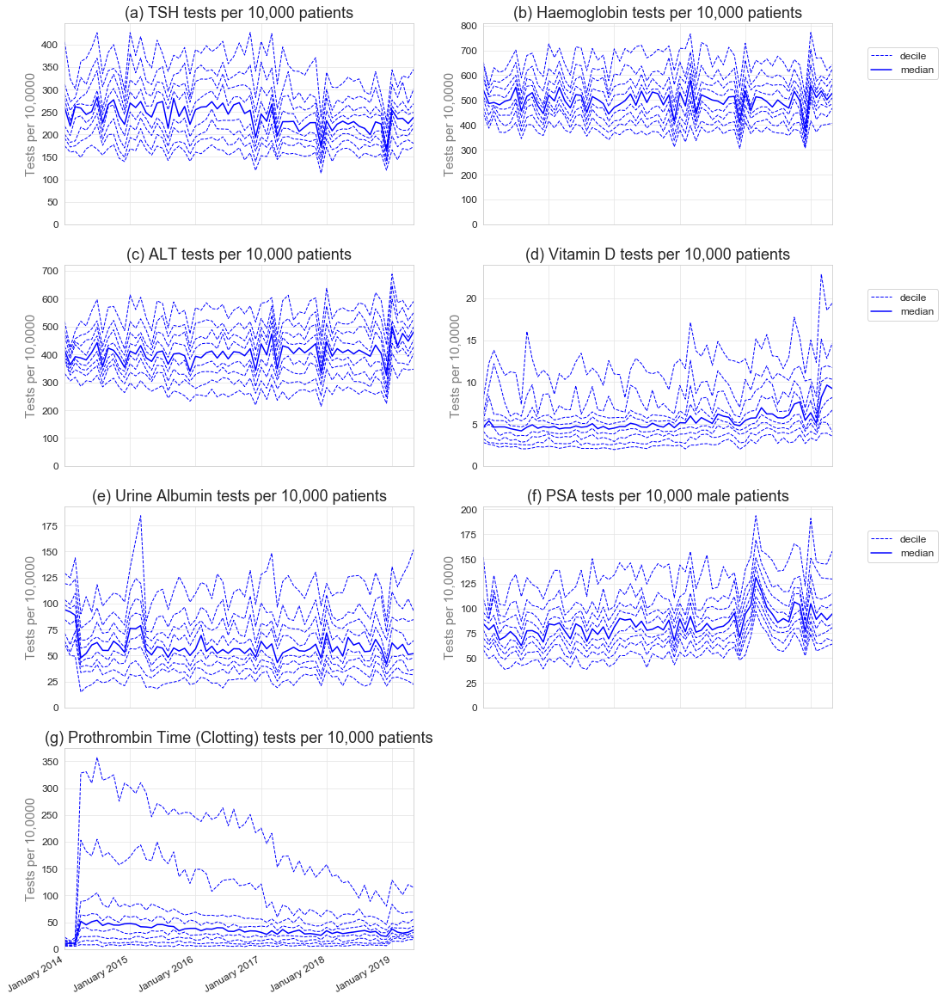

In [7]:
from ebmdatalab import charts
import matplotlib.gridspec as gridspec

import importlib
importlib.reload(charts)

# rearrange data
rate = df.copy()

rate = rate.groupby(["datalab_testcode", "month", "practice_id", "total_list_size"])["count"].sum().reset_index()
rate["count_per_10k"] = 10000*rate["count"]/rate["total_list_size"]

# For PSA tests, calculate rate per 10k MALE popoulation
rate_m = df.copy()
rate_m = rate_m.loc[rate_m["datalab_testcode"]=="PSA"].groupby(["datalab_testcode", "month", "practice_id", "male_population"])["count"].sum().reset_index()
rate_m["PSA_M"] = 10000*rate_m["count"]/rate_m["male_population"]


data = rate.set_index(["month","practice_id","datalab_testcode"]).drop(["total_list_size","count"],axis=1).unstack().reset_index(col_level=1)
data.columns = data.columns.droplevel()

# add the male-adjusted PSA rates
data = data.merge(rate_m[["practice_id","month","PSA_M"]], on=["practice_id","month"])


s = [(0,'TSH',0,0,'(a) TSH'),
     (1,'HB',0,1,'(b) Haemoglobin'),
     (2,'ALT',1,0,'(c) ALT'),
     (3,'VITD',1,1,'(d) Vitamin D'),
     (4,'UALB',2,0,'(e) Urine Albumin'),
     (5,'PSA_M',2,1,'(f) PSA'),
     (6,'PT',3,0,'(g) Prothrombin Time (Clotting)')     
    ]

fig = plt.figure(figsize=(16,22)) 


gs = gridspec.GridSpec(4,2)  # grid layout for subplots

# Plot each subplot using a loop
for i in s:
    ax = plt.subplot(gs[i[2], i[3]])  # position of subplot in grid using coordinates listed in s
    if i[1][-2:]=="_M":
        title = i[4] + " tests per 10,000 male patients"
    else:
        title = i[4] + " tests per 10,000 patients"
    plt = charts.deciles_chart(
        data,
        period_column='month',
        column=i[1],
        title=title,
        ylabel="Tests per 10,0000",
        show_outer_percentiles=False,
        show_legend=i[3]==1,
        ax=ax)


plt.show()


## Set up functions to plot and export charts showing each practice against deciles

In [21]:

def test_rate(num=["K"], den=["total_list_size"], sort_method= "mean" , sort_period= 12, min_tests_pm=100):
        
    if ''.join(den) == "total_list_size":
        data = df.copy().loc[df['datalab_testcode'].isin(num)]
    else:
        data = df.copy().loc[df['datalab_testcode'].isin(den)]
    
    data["numerator_flag"] = 0
    data.loc[data['datalab_testcode'].isin(num), "numerator_flag"] = 1
       
    # group and rearrange data
    data = data.groupby(["month", "practice_id", "total_list_size", "numerator_flag"]).agg({"count":"sum","error":"sum"}).unstack().fillna(0).reset_index()
   
    # calculate proportions
    if ''.join(den) == "total_list_size":
        data["measure_value"] = 10000*data[("count",1)]/(data["total_list_size"])
        data["measure_value_error"] = 10000*data[("error",1)]/(data["total_list_size"])
    else:
        data["measure_value"] = data[("count",1)]/(data[("count",0)]+data[("count",1)])
        data["measure_value_error"] = data[("error",1)]/(data[("count",0)]+data[("count",1)])

    data["total"] = data[("count")].sum(axis=1)
    
    # remove very low test volumes and practices with less than x months of data
    data = data.loc[data["total"]> min_tests_pm]
    data = data.set_index("practice_id").loc[data["practice_id"].value_counts() > 6 ].reset_index()
    
    # flatten multiindex
    data.columns = [(x + '_' + str(i)).rstrip('_') for x, i in zip(data.columns.get_level_values(0), data.columns.get_level_values(1))]

    # sort data - find each practice's highest proportion of tests above-range in last 12 months
    ranks = data.loc[(data["month"] >= data["month"].max()- pd.DateOffset(months=sort_period))]
    ranks = ranks.groupby(["practice_id"])["measure_value"].agg(sort_method).rank(ascending=False).reset_index().rename(columns={"measure_value":"measure_value_rank"})

    # apply sort to data
    data = data.merge(ranks, on = "practice_id").sort_values(by=["measure_value_rank","month"])
    return data
    


def plot_test_rate(num=["K"], den=["total_list_size"], sort_method= "mean" , sort_period= 12, min_tests_pm=100):

    data = test_rate(num=num, den=den, sort_method=sort_method, sort_period=sort_period, min_tests_pm=min_tests_pm)
    if ''.join(den) == "total_list_size":
        den_type = "10,000 population"
    else:
        den_type = ' and '.join(den)
    
# count number of practices in order to set the required number of subplots
    no_figs = np.int(data.practice_id.nunique()/2+data.practice_id.nunique()%2)

    
    fig, axs = plt.subplots(no_figs, 2, figsize = (16,no_figs*4.5), facecolor='w')
    fig.subplots_adjust(hspace = .25, wspace=.2)
    fig_no = 0

    for ax, p in zip(axs.ravel(), data["practice_id"].unique()):
        fig_no = fig_no+1
        ax.set_title('practice '+str(p)+' - '+' and '.join(num)+" tests per "+den_type.rjust(1, ' '), size=14)
        color = "r"
    # select and plot data for each practice
        practice = data[(data['practice_id'] == p)]
        ax.plot(practice['month'], practice["measure_value"], color, linewidth=3)
        ax.fill_between(practice['month'], practice["measure_value"]-practice["measure_value_error"], practice["measure_value"]+practice["measure_value_error"], color=color, alpha=0.4)
    
    # plot deciles onto every subplot:
        charts.deciles_chart(
            data,
            period_column='month',
            column="measure_value",
            ylabel="tests per "+den_type,
            show_legend=False,
            show_outer_percentiles=False,
            ax=ax)
        ax.set_ylim(0,data["measure_value"].max()*1.02)
    
    return fig
    
    # save subplots # this kind-of works but isn't great
    #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    #fig.savefig('/Users/hcurtis/Documents/Python Scripts/openpathology/figures/{}_{}_{}_{}.png'.format(testcode,measure,p,fig_no), 
    #            bbox_inches=extent.expanded(1.25, 1.02)) # Pad the saved area by 25% in the x-direction and 2% in the y-direction
    


### Export charts to file

In [22]:

def export_charts_test_rate(num=["K"], den=["total_list_size"], sort_method="mean", sort_period= 12, min_tests_pm=10):
    data = test_rate(num=num, den=den, sort_method=sort_method, sort_period=sort_period, min_tests_pm=min_tests_pm)
    
    if ''.join(den) == "total_list_size":
        den_type = "10,000 population" ## for figure titles
        den2 = "10k"   ## for file name
    else:
        den_type = ' and '.join(den)
        den2 = '-'.join(den)
            

    fig_no=0

    for p in data["practice_id"].unique():
        fig,ax = plt.subplots()
        fig_no = fig_no+1
        color="r"
        ax.set_title('practice '+str(p)+' - '+' and '.join(num)+" tests per "+den_type.rjust(1, ' '), size=14)
        
            # select and plot data for each practice
        practice = data[(data['practice_id'] == p)]
        ax.plot(practice['month'], practice["measure_value"], color, linewidth=3)
        ax.fill_between(practice['month'], practice["measure_value"]-practice["measure_value_error"], practice["measure_value"]+practice["measure_value_error"], color=color, alpha=0.4)
    
    # plot deciles onto every subplot:
        charts.deciles_chart(
            data,
            period_column='month',
            column="measure_value",
            ylabel="tests per "+den_type,
            show_legend=False,
            show_outer_percentiles=False,
            ax=ax)
        ax.set_ylim(0,data["measure_value"].max()*1.02)
        
        plt.savefig('/Users/hcurtis/Documents/Python Scripts/openpathology/figures_a/{}per{}_practice{}_{}.png'.format('-'.join(num),den2,p,fig_no))



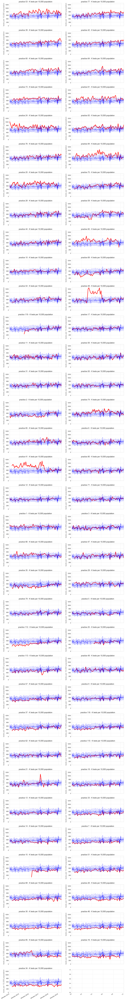

In [23]:
plot_test_rate()

In [24]:
export_charts_test_rate()

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


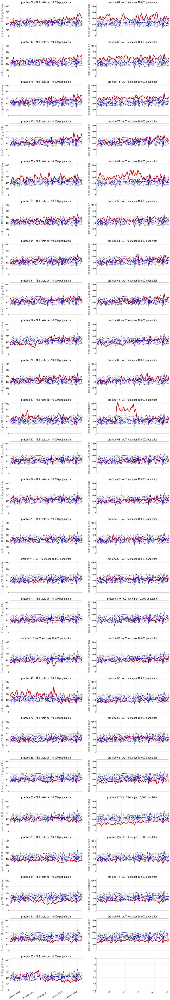

In [14]:
plot_test_rate(num=["ALT"],den=["total_list_size"], min_tests_pm=20)

In [25]:
export_charts_test_rate(num=["ALT"], den=["total_list_size"], min_tests_pm=20)

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


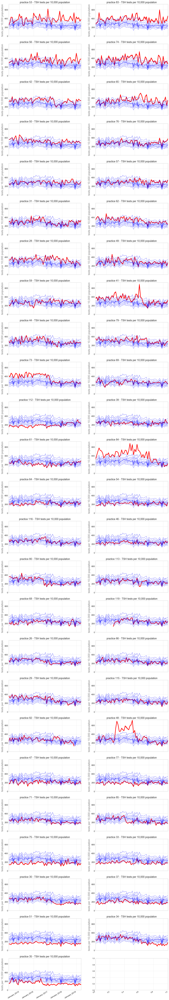

In [15]:
plot_test_rate(num=["TSH"],den=["total_list_size"], min_tests_pm=20)

In [26]:
export_charts_test_rate(num=["TSH"],den=["total_list_size"], min_tests_pm=20)

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


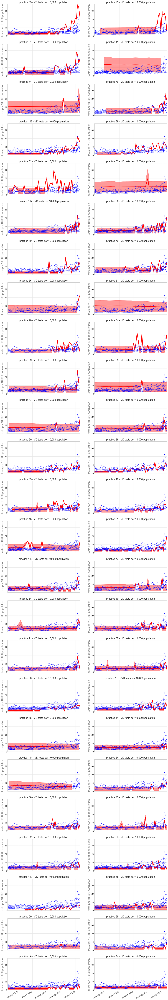

In [17]:
plot_test_rate(num=["VITD"],den=["total_list_size"], min_tests_pm=2)

In [27]:
export_charts_test_rate(num=["VITD"],den=["total_list_size"], min_tests_pm=2)

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


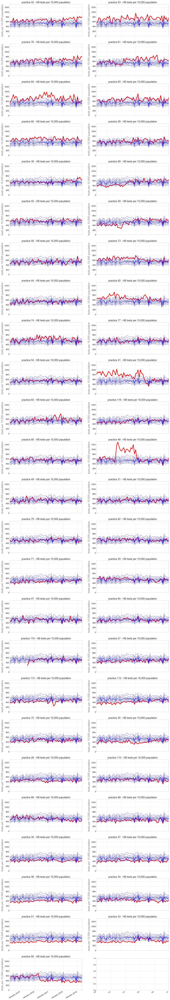

In [18]:
plot_test_rate(num=["HB"],den=["total_list_size"], min_tests_pm=50)

In [28]:
export_charts_test_rate(num=["HB"],den=["total_list_size"], min_tests_pm=50)

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


## Proportion of CRP/ESR/PV which were CRP

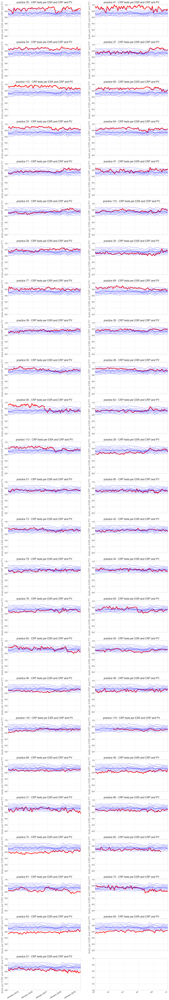

In [20]:
plot_test_rate(num=["CRP"],den=["ESR","CRP","PV"], sort_method="max", min_tests_pm=40)

In [29]:
export_charts_test_rate(num=["CRP"], den=["CRP","ESR","PV"], sort_method="max", min_tests_pm=40)

C:\Users\hcurtis\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
